# AI & Biomedical : Big data in bioimagery


sarah.laroui@inria.fr
05/10/2020
 
Nom 1 : MESSAN Aurore & Nom 2: MONIN Donélia 

A binomial report must be sent by email no later than 14/10.

## Introduction: 

In this project a high content microscopy based screening focused on the effects of endocrinedisruptors on prostatic cancer cells metabolism. Mitochondria have a wide variety of forms due to different types of stress (metabolic, energy, etc.) that the cell and its mitochondria undergo.

In this TP, the goal is to develop a tool to detect and classify the different mitochondrial network morphology types from microscopy acquired images.

In [1]:
# Useful functions and imports

import matplotlib.pyplot as plt
import numpy as np
from skimage.measure import regionprops, label

import os
import os.path
import sys
import glob as glb
from skimage import io, img_as_uint
from skimage.io import imsave

From a computer point of view, an image is a matrix where each box represents
a pixel. These boxes contain either a single value if it is an image in gray levels, three values corresponding to the three primary colors if it is an image
in colors. Mixing these intensities will give a pixel-specific color.


  - Import and display images with pyplot. 

In [2]:
## Parameter initialization

image_ext = 'tif'

Path = 'C:/Users/user/Desktop/compression/TP_Biomedical_2020/TP_Biomedical_2020/Data/' #'Enter the path to the folder containing the train and test folders'

## Creation of the "Mask" folder, this folder will contain the binary masks of the images

if not os.path.exists(Path + "Mask/"):
    os.mkdir(Path + "Mask/")

## Reading images

##### Train

path_images_TrainingSet = Path + 'Train/'
All_images_TrainingSet = glb.glob(os.path.join(os.path.expanduser(path_images_TrainingSet), '*.' + image_ext))
print (path_images_TrainingSet)

##### Test

path_images_TestSet = Path + 'Test/'
All_images_TestSet = glb.glob(os.path.join(os.path.expanduser(path_images_TestSet), '*.' + image_ext))


C:/Users/user/Desktop/compression/TP_Biomedical_2020/TP_Biomedical_2020/Data/Train/


Function allowing the detection of the objects of the image.

In this part:
- What represents the parameter s?
- Try several threshold values on the intensity of the image, until you find the most suitable.
- Explain the noise in the image.
- Determine a second threshold on the size of the connected component which are not to be taken into account.
- Complete the input of the function remove_small_objects.
- Explain in a few lines the role of the mathematical morphology operations used and determine the radius of the structural element.




1. Le paramètre s représente les éléments de l'image qui sont soit en rouge, en vert, ou en bleu. En effet, quand s=0, il affiche les éléments de l'image qui sont en rouge. Quand s=1, on voit afficher les parties de l'image en vert (dans ce cas, les filaments sur les images). Quand s=2, on voit afficher les éléments de l'image en vert(les ronds sur les différentes images). Il affiche une image noire quand il n'y a pas d'elements rouge, vert et bleu. 

2. Nous avons trouvé qu'avec une valeur de 100, les filaments sont bien definis sur les images et ce sur plusieurs images. 

3. Le bruit est causé par les fluctuations stochastiques des circuits génétiques (transcription et translation) ou les circuits d'un scanner.

4. Fait

5. Fait 

6. L'idée de base de la morphologie binaire est de sonder une image avec une forme simple et prédéfinie, en tirant des conclusions sur la façon dont cette forme s'adapte ou non aux formes de l'image. Remove_small_objects() --> Supprime les objets plus petits que la taille donnée en paramètres (min_size). Binary_opening() & Binary_closing() --> ils permettent de réduire le bruit. La fonction morphology.disk() -> fournit un élément structuré utilisé pour Binary_opening() & Binary_closing().

In [3]:
def normalize(img):
  '''
  Normalize the exposure of an image.
  @args:
    {numpy.ndarray} img: an array of image pixels with shape:
      (height, width)
  @returns:
    {numpy.ndarray} an image with shape of `img` wherein
      all values are normalized such that the min=0 and max=255
  '''
  _min = img.min()
  _max = img.max()
  return img - _min * 255 / (_max - _min)


#s=1
#img1 = (img[:, :, s]) 
#plt.imshow(img1)
#plt.show()

#IN = normalize(img1)
#plt.imshow(IN)
#plt.show()

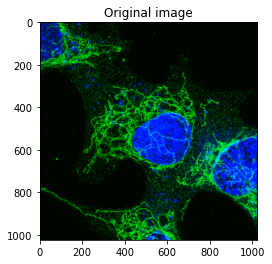

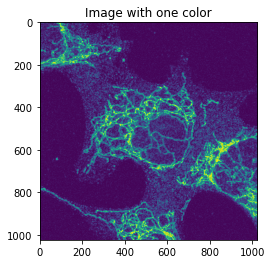

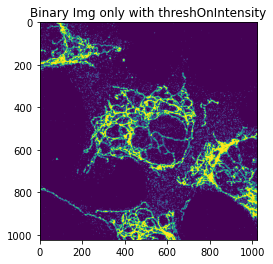

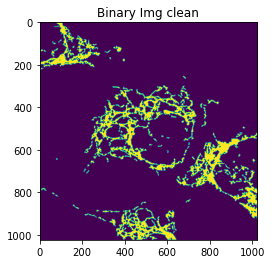

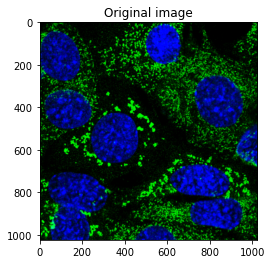

...

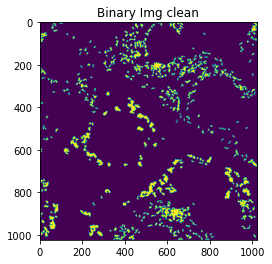

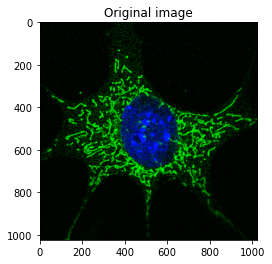

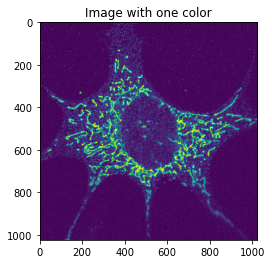

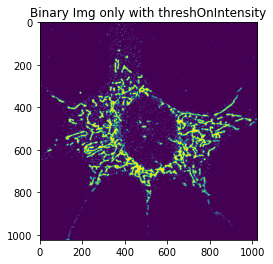

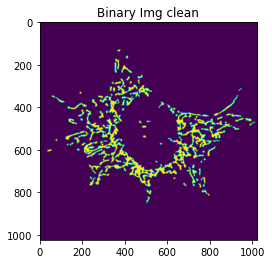

In [4]:

def Objectdetection(img):
    
    s=1
    img = (img[:, :, s]) 

    IN = normalize(img) 
     
    plt.title("Image with one color")
    plt.imshow(img)
    plt.figure()

    from skimage import filters

    ThreshOnIntensity = 100 
    
    BinaryImg = IN > ThreshOnIntensity

    
    from skimage.morphology import remove_small_objects

    ThreshOnObjSize = 50

    final = 1 * remove_small_objects(BinaryImg, min_size = ThreshOnObjSize)
    from skimage import morphology
    from scipy import ndimage as nd
    
    
    #morphology.disk(radius) 
    #--> Generates a flat, disk-shaped structuring element.

    BinaryImg_clean = nd.binary_closing(final, morphology.disk(1))
    BinaryImg_clean = nd.binary_opening(BinaryImg_clean, morphology.disk(1))
   
    plt.imshow(BinaryImg)
    plt.title("Binary Img only with threshOnIntensity")
    plt.show()
    
    plt.imshow(BinaryImg_clean)
    plt.title("Binary Img clean")
    plt.show()
    
    return img, BinaryImg_clean

listImages = ['filament27.tif', 'frag5 zoom 1.5.tif', 'normal23.tif']
for element in listImages:
    img= plt.imread('Data/Train/' + element)
    plt.imshow(img)
    plt.title("Original image")
    plt.show()
    image1, image2 = Objectdetection(img)
    


Function allowing the calculation of objects features.

In this part:

- Explain the three parameters (areas, circularity, Length_weighted)
- Do you thing these parameters are adapted to discriminate the different types of networks? (Detail your answer)


1. Explication des 3 paramètres:
    
    - Areas est un tableau contenant le nombre de pixels de chaque region de l'image.
    - Circularity est un tableau contenant la mesure de la proximité de la forme de chaque région à un cercle.
    - Length_weighted : L'axe médian de l'objet

2. Ces paramètres sont assez adaptés. En effet, ils nous permettent de comparer les différentes régions de l'image. Ils peuvent nous aider à savoir la forme et la densité de chaque partie de l'image et ainsi deduire le type de cellules (filamenteux, hyper filamenteux ou non).

In [5]:
def FeaturesOfObjects(labels, img):

    from skimage import morphology
    from scipy import ndimage as nd

    areas = [r.area for r in regionprops(labels)]
    centroids = [r.centroid for r in regionprops(labels)]
    perimeters = [r.perimeter for r in regionprops(labels)]
    orientations = [r.orientation for r in regionprops(labels)]

    coord = np.array([[int(r.centroid[0]), int(r.centroid[1])] for r in regionprops(labels)])
    coord = coord.reshape(2, len(coord))

    Circularity = [((r.area)/((r.perimeter)**2)) for r in regionprops(labels)]

    squelette = morphology.skeletonize(labels>0)
    dist_on_skel = nd.distance_transform_edt(labels>0)   # to the background for pixels of the skeleton
    Length_weighted = dist_on_skel * squelette
    Length_weighted_List = [np.sum(Length_weighted[(squelette*labels)==l]) for l in np.unique(labels)[1:]]
    
    return areas, centroids, perimeters, orientations, coord, Circularity, Length_weighted_List


T


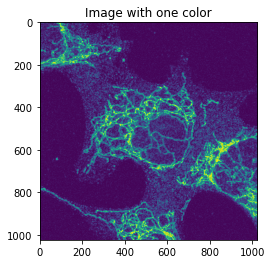

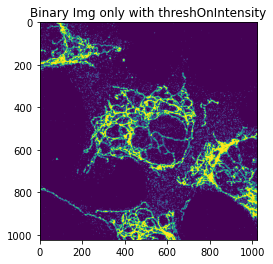

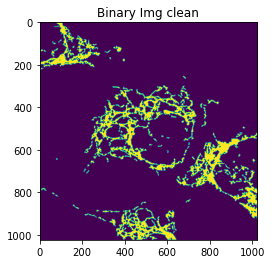

C:\Users\user\anaconda3\lib\site-packages\skimage\util\dtype.py:454: UserWarning: Downcasting int64 to uint16 without scaling because max value 130 fits in uint16
  return convert(image, np.uint16, force_copy)
<ipython-input-6-720188a3eef5>:17: UserWarning: C:/Users/user/Desktop/compression/TP_Biomedical_2020/TP_Biomedical_2020/Data/Mask/Train/filament27.tif is a low contrast image
  imsave(Path + "Mask/Train/" + basename, img_as_uint(labels))


T


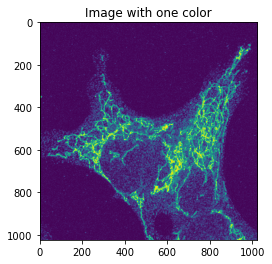

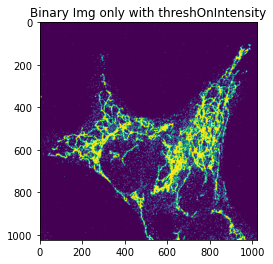

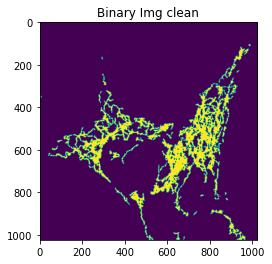

C:\Users\user\anaconda3\lib\site-packages\skimage\util\dtype.py:454: UserWarning: Downcasting int64 to uint16 without scaling because max value 72 fits in uint16
  return convert(image, np.uint16, force_copy)
<ipython-input-6-720188a3eef5>:17: UserWarning: C:/Users/user/Desktop/compression/TP_Biomedical_2020/TP_Biomedical_2020/Data/Mask/Train/filament28.tif is a low contrast image
  imsave(Path + "Mask/Train/" + basename, img_as_uint(labels))


T


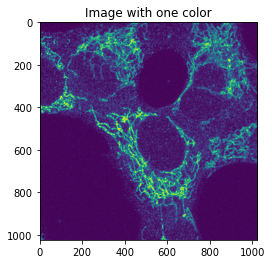

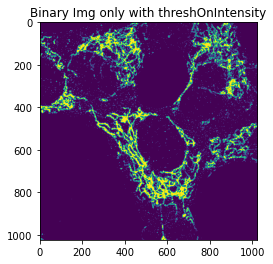

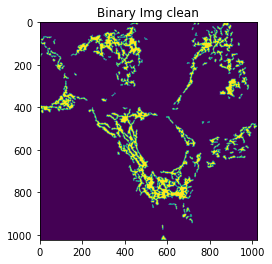

C:\Users\user\anaconda3\lib\site-packages\skimage\util\dtype.py:454: UserWarning: Downcasting int64 to uint16 without scaling because max value 125 fits in uint16
  return convert(image, np.uint16, force_copy)
<ipython-input-6-720188a3eef5>:17: UserWarning: C:/Users/user/Desktop/compression/TP_Biomedical_2020/TP_Biomedical_2020/Data/Mask/Train/filament29.tif is a low contrast image
  imsave(Path + "Mask/Train/" + basename, img_as_uint(labels))


T


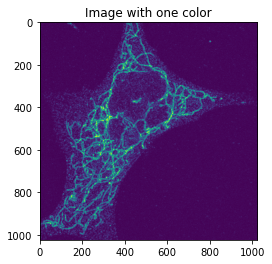

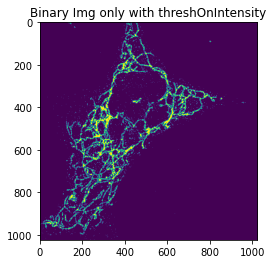

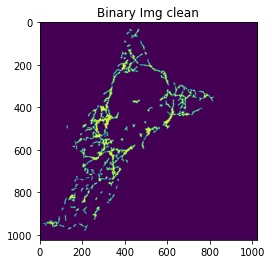

C:\Users\user\anaconda3\lib\site-packages\skimage\util\dtype.py:454: UserWarning: Downcasting int64 to uint16 without scaling because max value 122 fits in uint16
  return convert(image, np.uint16, force_copy)
<ipython-input-6-720188a3eef5>:17: UserWarning: C:/Users/user/Desktop/compression/TP_Biomedical_2020/TP_Biomedical_2020/Data/Mask/Train/filament30.tif is a low contrast image
  imsave(Path + "Mask/Train/" + basename, img_as_uint(labels))


T


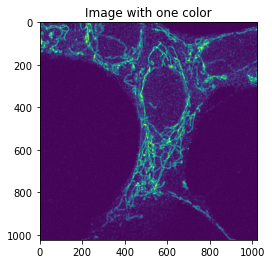

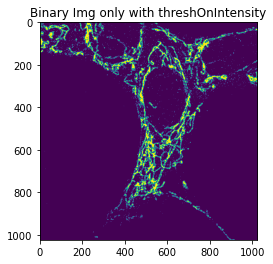

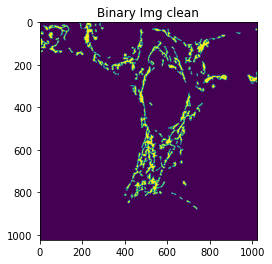

C:\Users\user\anaconda3\lib\site-packages\skimage\util\dtype.py:454: UserWarning: Downcasting int64 to uint16 without scaling because max value 112 fits in uint16
  return convert(image, np.uint16, force_copy)
<ipython-input-6-720188a3eef5>:17: UserWarning: C:/Users/user/Desktop/compression/TP_Biomedical_2020/TP_Biomedical_2020/Data/Mask/Train/filament31.tif is a low contrast image
  imsave(Path + "Mask/Train/" + basename, img_as_uint(labels))


T


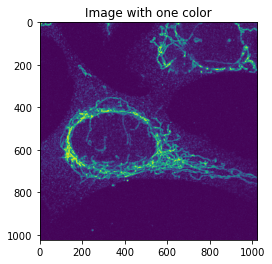

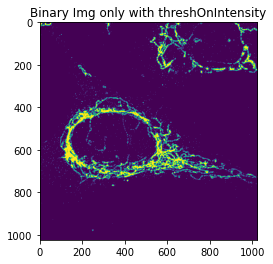

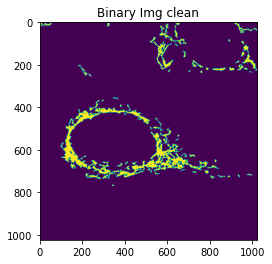

C:\Users\user\anaconda3\lib\site-packages\skimage\util\dtype.py:454: UserWarning: Downcasting int64 to uint16 without scaling because max value 96 fits in uint16
  return convert(image, np.uint16, force_copy)
<ipython-input-6-720188a3eef5>:17: UserWarning: C:/Users/user/Desktop/compression/TP_Biomedical_2020/TP_Biomedical_2020/Data/Mask/Train/filament32.tif is a low contrast image
  imsave(Path + "Mask/Train/" + basename, img_as_uint(labels))


T


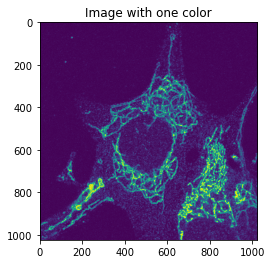

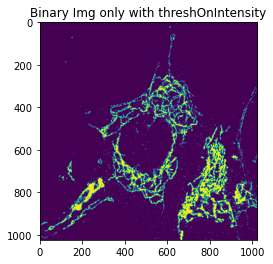

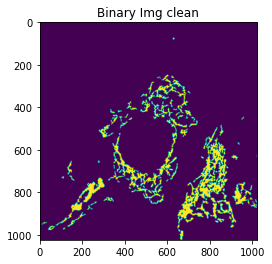

C:\Users\user\anaconda3\lib\site-packages\skimage\util\dtype.py:454: UserWarning: Downcasting int64 to uint16 without scaling because max value 117 fits in uint16
  return convert(image, np.uint16, force_copy)
<ipython-input-6-720188a3eef5>:17: UserWarning: C:/Users/user/Desktop/compression/TP_Biomedical_2020/TP_Biomedical_2020/Data/Mask/Train/filament33.tif is a low contrast image
  imsave(Path + "Mask/Train/" + basename, img_as_uint(labels))


T


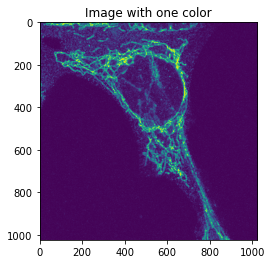

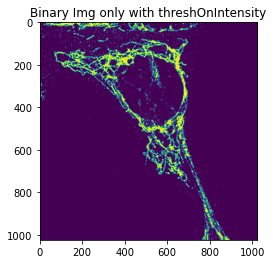

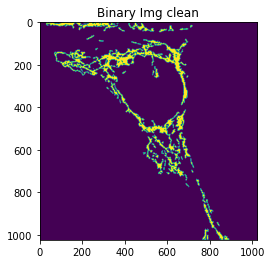

C:\Users\user\anaconda3\lib\site-packages\skimage\util\dtype.py:454: UserWarning: Downcasting int64 to uint16 without scaling because max value 79 fits in uint16
  return convert(image, np.uint16, force_copy)
<ipython-input-6-720188a3eef5>:17: UserWarning: C:/Users/user/Desktop/compression/TP_Biomedical_2020/TP_Biomedical_2020/Data/Mask/Train/filament34.tif is a low contrast image
  imsave(Path + "Mask/Train/" + basename, img_as_uint(labels))


T


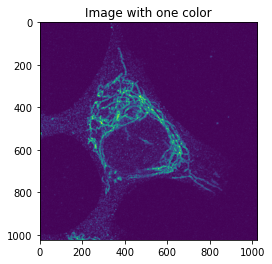

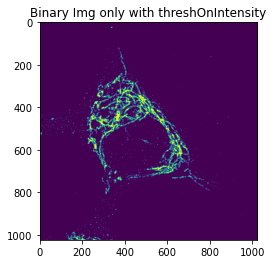

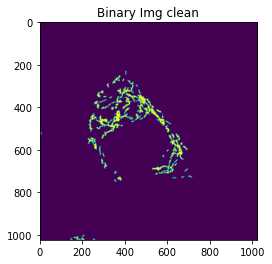

C:\Users\user\anaconda3\lib\site-packages\skimage\util\dtype.py:454: UserWarning: Downcasting int64 to uint16 without scaling because max value 64 fits in uint16
  return convert(image, np.uint16, force_copy)
<ipython-input-6-720188a3eef5>:17: UserWarning: C:/Users/user/Desktop/compression/TP_Biomedical_2020/TP_Biomedical_2020/Data/Mask/Train/filament35.tif is a low contrast image
  imsave(Path + "Mask/Train/" + basename, img_as_uint(labels))


T


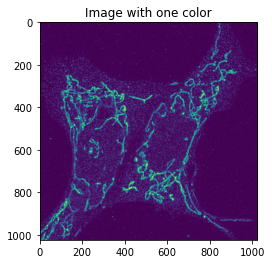

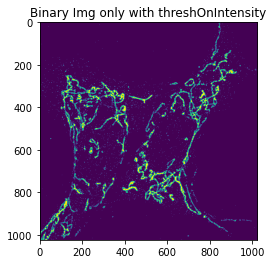

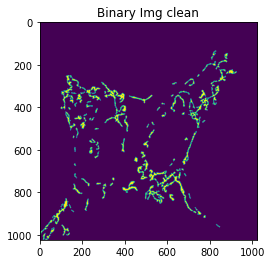

C:\Users\user\anaconda3\lib\site-packages\skimage\util\dtype.py:454: UserWarning: Downcasting int64 to uint16 without scaling because max value 139 fits in uint16
  return convert(image, np.uint16, force_copy)
<ipython-input-6-720188a3eef5>:17: UserWarning: C:/Users/user/Desktop/compression/TP_Biomedical_2020/TP_Biomedical_2020/Data/Mask/Train/filameteux zoom1.tif is a low contrast image
  imsave(Path + "Mask/Train/" + basename, img_as_uint(labels))


T


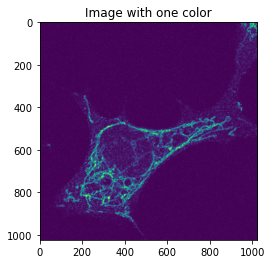

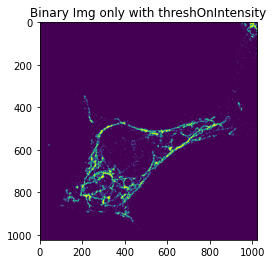

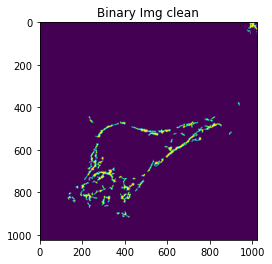

C:\Users\user\anaconda3\lib\site-packages\skimage\util\dtype.py:454: UserWarning: Downcasting int64 to uint16 without scaling because max value 67 fits in uint16
  return convert(image, np.uint16, force_copy)
<ipython-input-6-720188a3eef5>:17: UserWarning: C:/Users/user/Desktop/compression/TP_Biomedical_2020/TP_Biomedical_2020/Data/Mask/Train/filameteux3 zoom1.5.tif is a low contrast image
  imsave(Path + "Mask/Train/" + basename, img_as_uint(labels))


T


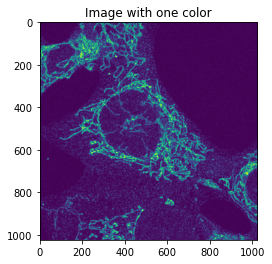

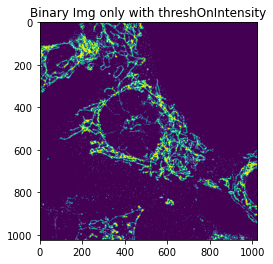

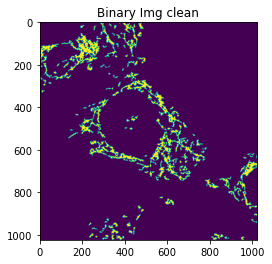

C:\Users\user\anaconda3\lib\site-packages\skimage\util\dtype.py:454: UserWarning: Downcasting int64 to uint16 without scaling because max value 192 fits in uint16
  return convert(image, np.uint16, force_copy)
<ipython-input-6-720188a3eef5>:17: UserWarning: C:/Users/user/Desktop/compression/TP_Biomedical_2020/TP_Biomedical_2020/Data/Mask/Train/filameteux4 zoom1.5.tif is a low contrast image
  imsave(Path + "Mask/Train/" + basename, img_as_uint(labels))


T


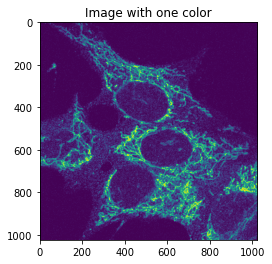

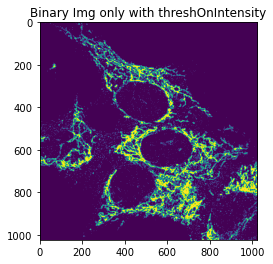

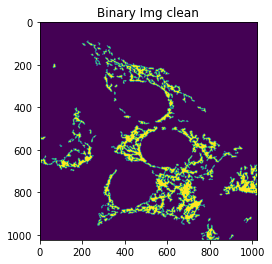

C:\Users\user\anaconda3\lib\site-packages\skimage\util\dtype.py:454: UserWarning: Downcasting int64 to uint16 without scaling because max value 118 fits in uint16
  return convert(image, np.uint16, force_copy)
<ipython-input-6-720188a3eef5>:17: UserWarning: C:/Users/user/Desktop/compression/TP_Biomedical_2020/TP_Biomedical_2020/Data/Mask/Train/filameteux5 zoom1.5.tif is a low contrast image
  imsave(Path + "Mask/Train/" + basename, img_as_uint(labels))


T


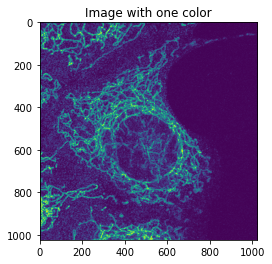

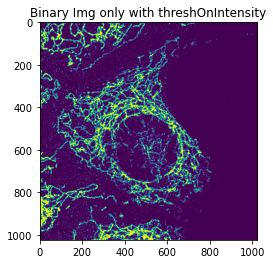

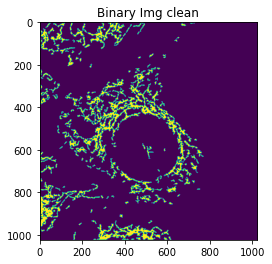

C:\Users\user\anaconda3\lib\site-packages\skimage\util\dtype.py:454: UserWarning: Downcasting int64 to uint16 without scaling because max value 226 fits in uint16
  return convert(image, np.uint16, force_copy)
<ipython-input-6-720188a3eef5>:17: UserWarning: C:/Users/user/Desktop/compression/TP_Biomedical_2020/TP_Biomedical_2020/Data/Mask/Train/filameteux6 zoom1.5.tif is a low contrast image
  imsave(Path + "Mask/Train/" + basename, img_as_uint(labels))


T


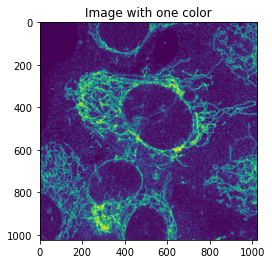

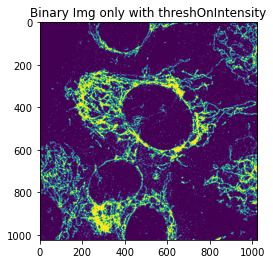

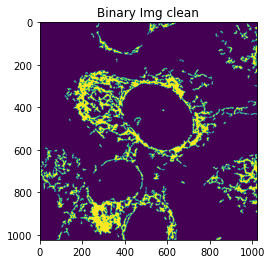

C:\Users\user\anaconda3\lib\site-packages\skimage\util\dtype.py:454: UserWarning: Downcasting int64 to uint16 without scaling because max value 205 fits in uint16
  return convert(image, np.uint16, force_copy)
<ipython-input-6-720188a3eef5>:17: UserWarning: C:/Users/user/Desktop/compression/TP_Biomedical_2020/TP_Biomedical_2020/Data/Mask/Train/filameteux7 zoom1.5.tif is a low contrast image
  imsave(Path + "Mask/Train/" + basename, img_as_uint(labels))


T


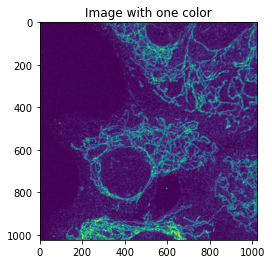

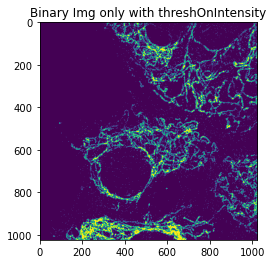

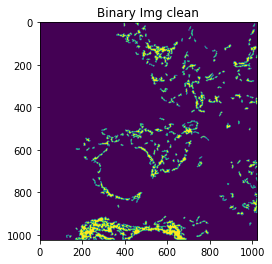

C:\Users\user\anaconda3\lib\site-packages\skimage\util\dtype.py:454: UserWarning: Downcasting int64 to uint16 without scaling because max value 227 fits in uint16
  return convert(image, np.uint16, force_copy)
<ipython-input-6-720188a3eef5>:17: UserWarning: C:/Users/user/Desktop/compression/TP_Biomedical_2020/TP_Biomedical_2020/Data/Mask/Train/filameteux8 zoom1.5.tif is a low contrast image
  imsave(Path + "Mask/Train/" + basename, img_as_uint(labels))


T


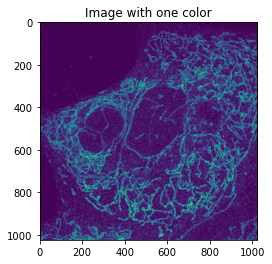

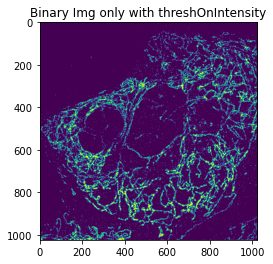

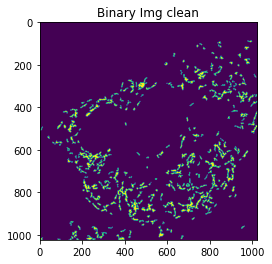

C:\Users\user\anaconda3\lib\site-packages\skimage\util\dtype.py:454: UserWarning: Downcasting int64 to uint16 without scaling because max value 357 fits in uint16
  return convert(image, np.uint16, force_copy)
<ipython-input-6-720188a3eef5>:17: UserWarning: C:/Users/user/Desktop/compression/TP_Biomedical_2020/TP_Biomedical_2020/Data/Mask/Train/filameteux9 zoom1.5.tif is a low contrast image
  imsave(Path + "Mask/Train/" + basename, img_as_uint(labels))


T


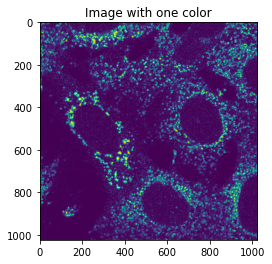

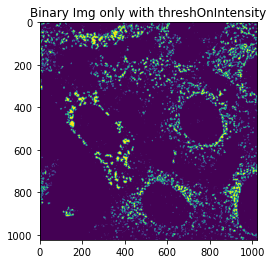

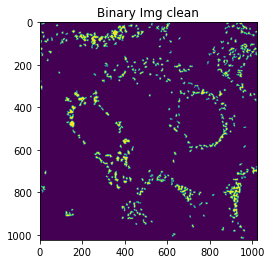

C:\Users\user\anaconda3\lib\site-packages\skimage\util\dtype.py:454: UserWarning: Downcasting int64 to uint16 without scaling because max value 350 fits in uint16
  return convert(image, np.uint16, force_copy)
<ipython-input-6-720188a3eef5>:17: UserWarning: C:/Users/user/Desktop/compression/TP_Biomedical_2020/TP_Biomedical_2020/Data/Mask/Train/frag1 zoom 1.5.tif is a low contrast image
  imsave(Path + "Mask/Train/" + basename, img_as_uint(labels))


T


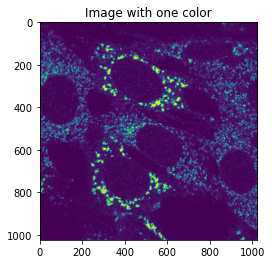

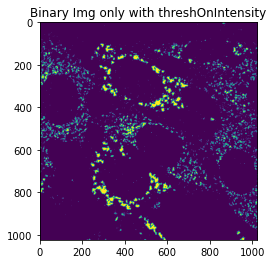

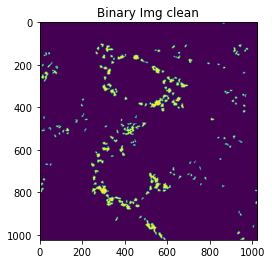

C:\Users\user\anaconda3\lib\site-packages\skimage\util\dtype.py:454: UserWarning: Downcasting int64 to uint16 without scaling because max value 177 fits in uint16
  return convert(image, np.uint16, force_copy)
<ipython-input-6-720188a3eef5>:17: UserWarning: C:/Users/user/Desktop/compression/TP_Biomedical_2020/TP_Biomedical_2020/Data/Mask/Train/frag10 zoom 1.5.tif is a low contrast image
  imsave(Path + "Mask/Train/" + basename, img_as_uint(labels))


T


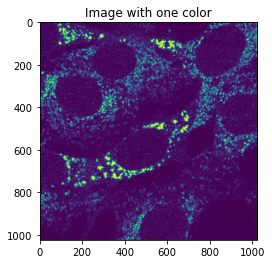

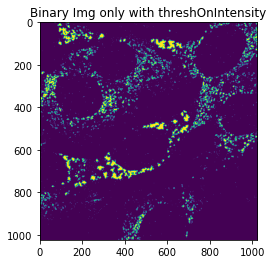

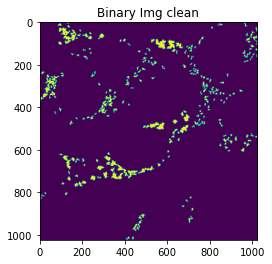

C:\Users\user\anaconda3\lib\site-packages\skimage\util\dtype.py:454: UserWarning: Downcasting int64 to uint16 without scaling because max value 223 fits in uint16
  return convert(image, np.uint16, force_copy)
<ipython-input-6-720188a3eef5>:17: UserWarning: C:/Users/user/Desktop/compression/TP_Biomedical_2020/TP_Biomedical_2020/Data/Mask/Train/frag2 zoom 1.5.tif is a low contrast image
  imsave(Path + "Mask/Train/" + basename, img_as_uint(labels))


T


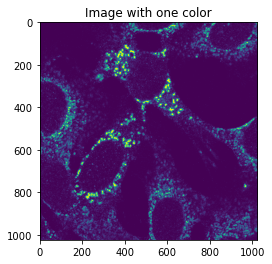

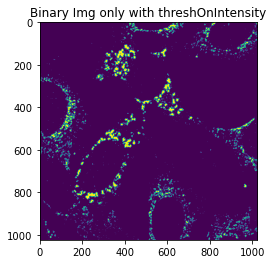

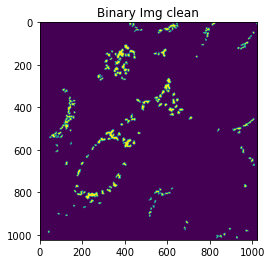

C:\Users\user\anaconda3\lib\site-packages\skimage\util\dtype.py:454: UserWarning: Downcasting int64 to uint16 without scaling because max value 142 fits in uint16
  return convert(image, np.uint16, force_copy)
<ipython-input-6-720188a3eef5>:17: UserWarning: C:/Users/user/Desktop/compression/TP_Biomedical_2020/TP_Biomedical_2020/Data/Mask/Train/frag3 zoom 1.5.tif is a low contrast image
  imsave(Path + "Mask/Train/" + basename, img_as_uint(labels))


T


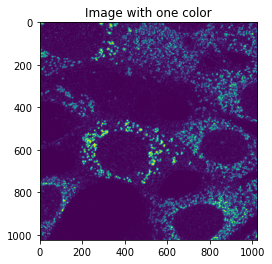

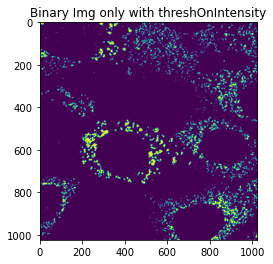

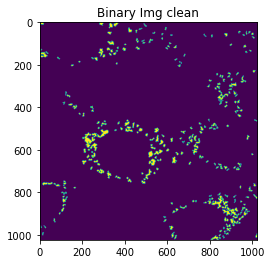

C:\Users\user\anaconda3\lib\site-packages\skimage\util\dtype.py:454: UserWarning: Downcasting int64 to uint16 without scaling because max value 269 fits in uint16
  return convert(image, np.uint16, force_copy)
<ipython-input-6-720188a3eef5>:17: UserWarning: C:/Users/user/Desktop/compression/TP_Biomedical_2020/TP_Biomedical_2020/Data/Mask/Train/frag4 zoom 1.5.tif is a low contrast image
  imsave(Path + "Mask/Train/" + basename, img_as_uint(labels))


T


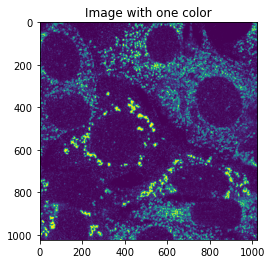

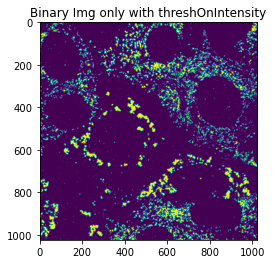

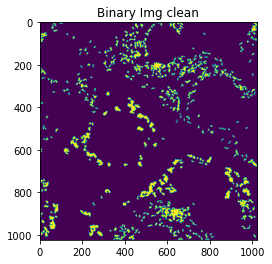

C:\Users\user\anaconda3\lib\site-packages\skimage\util\dtype.py:454: UserWarning: Downcasting int64 to uint16 without scaling because max value 384 fits in uint16
  return convert(image, np.uint16, force_copy)
<ipython-input-6-720188a3eef5>:17: UserWarning: C:/Users/user/Desktop/compression/TP_Biomedical_2020/TP_Biomedical_2020/Data/Mask/Train/frag5 zoom 1.5.tif is a low contrast image
  imsave(Path + "Mask/Train/" + basename, img_as_uint(labels))


T


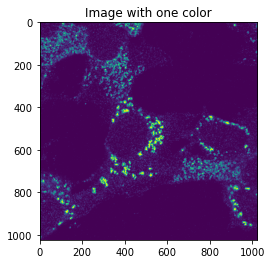

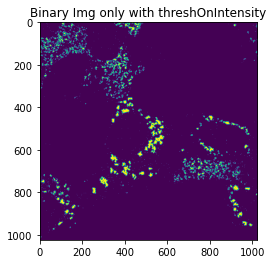

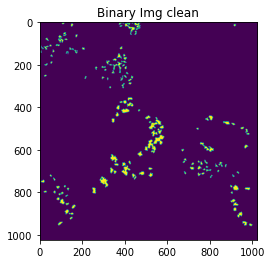

C:\Users\user\anaconda3\lib\site-packages\skimage\util\dtype.py:454: UserWarning: Downcasting int64 to uint16 without scaling because max value 151 fits in uint16
  return convert(image, np.uint16, force_copy)
<ipython-input-6-720188a3eef5>:17: UserWarning: C:/Users/user/Desktop/compression/TP_Biomedical_2020/TP_Biomedical_2020/Data/Mask/Train/frag6 zoom 1.5.tif is a low contrast image
  imsave(Path + "Mask/Train/" + basename, img_as_uint(labels))


T


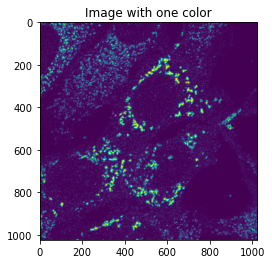

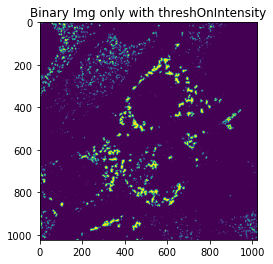

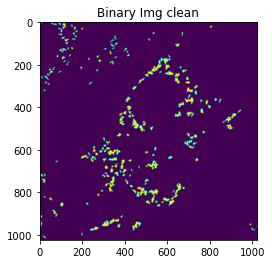

C:\Users\user\anaconda3\lib\site-packages\skimage\util\dtype.py:454: UserWarning: Downcasting int64 to uint16 without scaling because max value 188 fits in uint16
  return convert(image, np.uint16, force_copy)
<ipython-input-6-720188a3eef5>:17: UserWarning: C:/Users/user/Desktop/compression/TP_Biomedical_2020/TP_Biomedical_2020/Data/Mask/Train/frag7 zoom 1.5.tif is a low contrast image
  imsave(Path + "Mask/Train/" + basename, img_as_uint(labels))


T


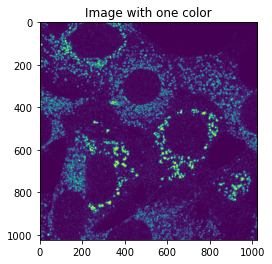

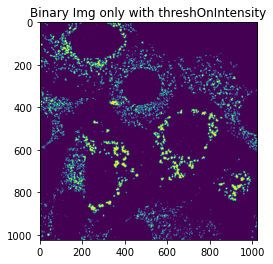

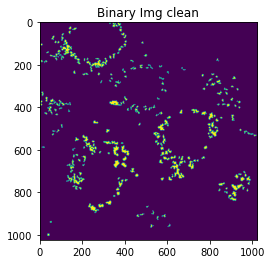

C:\Users\user\anaconda3\lib\site-packages\skimage\util\dtype.py:454: UserWarning: Downcasting int64 to uint16 without scaling because max value 261 fits in uint16
  return convert(image, np.uint16, force_copy)
<ipython-input-6-720188a3eef5>:17: UserWarning: C:/Users/user/Desktop/compression/TP_Biomedical_2020/TP_Biomedical_2020/Data/Mask/Train/frag8 zoom 1.5.tif is a low contrast image
  imsave(Path + "Mask/Train/" + basename, img_as_uint(labels))


T


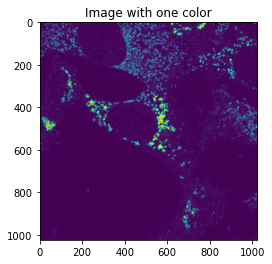

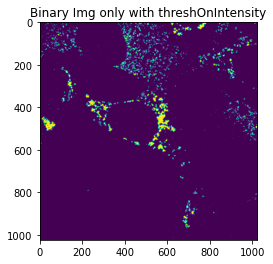

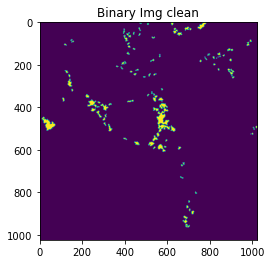

C:\Users\user\anaconda3\lib\site-packages\skimage\util\dtype.py:454: UserWarning: Downcasting int64 to uint16 without scaling because max value 105 fits in uint16
  return convert(image, np.uint16, force_copy)
<ipython-input-6-720188a3eef5>:17: UserWarning: C:/Users/user/Desktop/compression/TP_Biomedical_2020/TP_Biomedical_2020/Data/Mask/Train/frag9 zoom 1.5.tif is a low contrast image
  imsave(Path + "Mask/Train/" + basename, img_as_uint(labels))


T


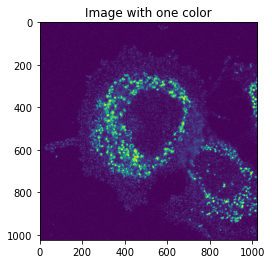

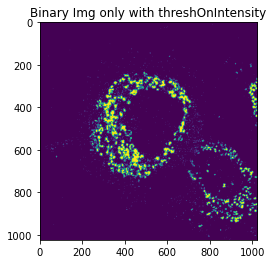

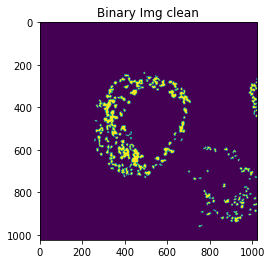

C:\Users\user\anaconda3\lib\site-packages\skimage\util\dtype.py:454: UserWarning: Downcasting int64 to uint16 without scaling because max value 145 fits in uint16
  return convert(image, np.uint16, force_copy)
<ipython-input-6-720188a3eef5>:17: UserWarning: C:/Users/user/Desktop/compression/TP_Biomedical_2020/TP_Biomedical_2020/Data/Mask/Train/fragmente13.tif is a low contrast image
  imsave(Path + "Mask/Train/" + basename, img_as_uint(labels))


T


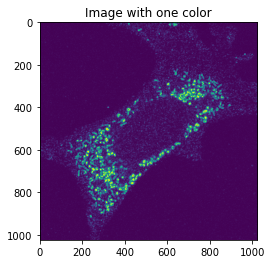

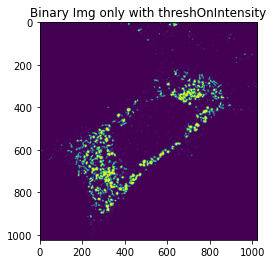

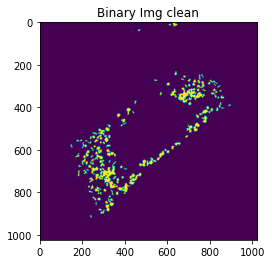

<ipython-input-6-720188a3eef5>:17: UserWarning: C:/Users/user/Desktop/compression/TP_Biomedical_2020/TP_Biomedical_2020/Data/Mask/Train/fragmente14.tif is a low contrast image
  imsave(Path + "Mask/Train/" + basename, img_as_uint(labels))


T


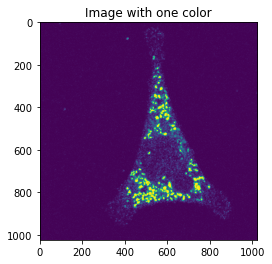

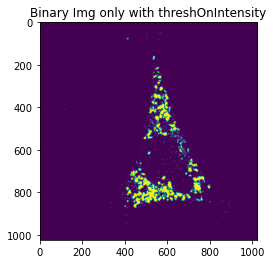

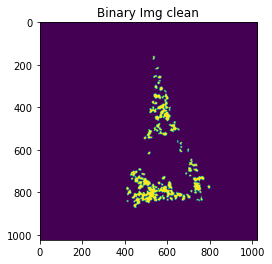

C:\Users\user\anaconda3\lib\site-packages\skimage\util\dtype.py:454: UserWarning: Downcasting int64 to uint16 without scaling because max value 48 fits in uint16
  return convert(image, np.uint16, force_copy)
<ipython-input-6-720188a3eef5>:17: UserWarning: C:/Users/user/Desktop/compression/TP_Biomedical_2020/TP_Biomedical_2020/Data/Mask/Train/fragmente15.tif is a low contrast image
  imsave(Path + "Mask/Train/" + basename, img_as_uint(labels))


T


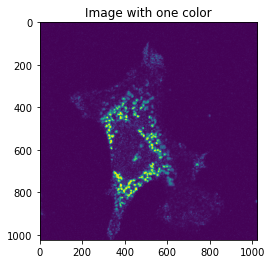

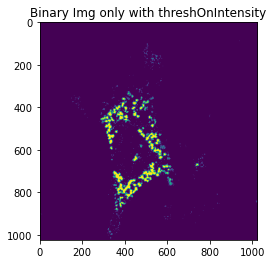

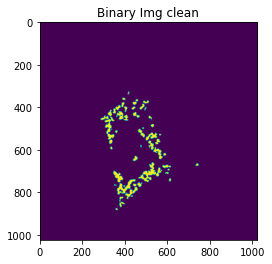

<ipython-input-6-720188a3eef5>:17: UserWarning: C:/Users/user/Desktop/compression/TP_Biomedical_2020/TP_Biomedical_2020/Data/Mask/Train/fragmente16.tif is a low contrast image
  imsave(Path + "Mask/Train/" + basename, img_as_uint(labels))


T


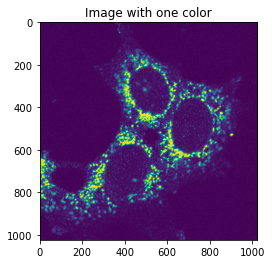

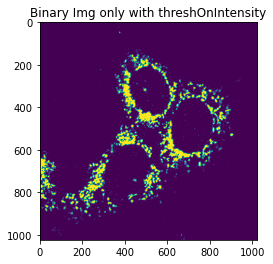

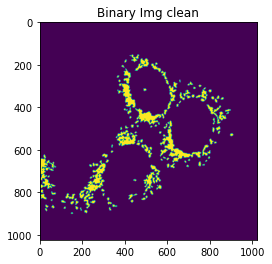

C:\Users\user\anaconda3\lib\site-packages\skimage\util\dtype.py:454: UserWarning: Downcasting int64 to uint16 without scaling because max value 134 fits in uint16
  return convert(image, np.uint16, force_copy)
<ipython-input-6-720188a3eef5>:17: UserWarning: C:/Users/user/Desktop/compression/TP_Biomedical_2020/TP_Biomedical_2020/Data/Mask/Train/fragmente17.tif is a low contrast image
  imsave(Path + "Mask/Train/" + basename, img_as_uint(labels))


T


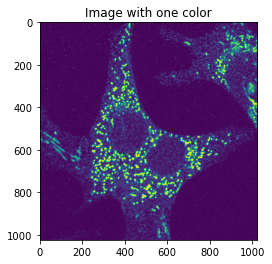

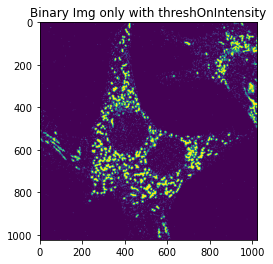

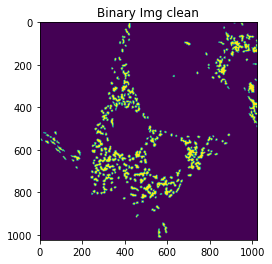

C:\Users\user\anaconda3\lib\site-packages\skimage\util\dtype.py:454: UserWarning: Downcasting int64 to uint16 without scaling because max value 221 fits in uint16
  return convert(image, np.uint16, force_copy)
<ipython-input-6-720188a3eef5>:17: UserWarning: C:/Users/user/Desktop/compression/TP_Biomedical_2020/TP_Biomedical_2020/Data/Mask/Train/fragmente22.tif is a low contrast image
  imsave(Path + "Mask/Train/" + basename, img_as_uint(labels))


T


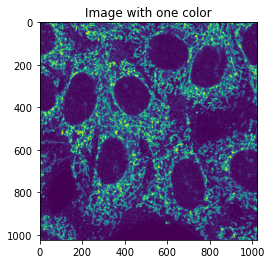

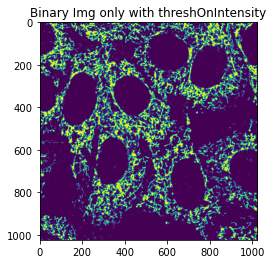

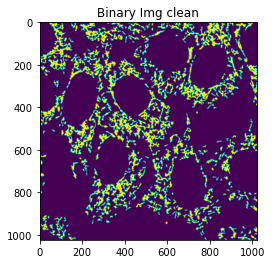

C:\Users\user\anaconda3\lib\site-packages\skimage\util\dtype.py:454: UserWarning: Downcasting int64 to uint16 without scaling because max value 410 fits in uint16
  return convert(image, np.uint16, force_copy)
<ipython-input-6-720188a3eef5>:17: UserWarning: C:/Users/user/Desktop/compression/TP_Biomedical_2020/TP_Biomedical_2020/Data/Mask/Train/normal zoom1.5.tif is a low contrast image
  imsave(Path + "Mask/Train/" + basename, img_as_uint(labels))


T


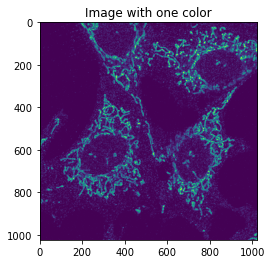

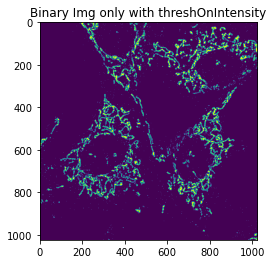

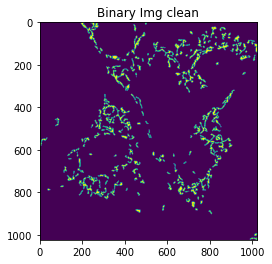

C:\Users\user\anaconda3\lib\site-packages\skimage\util\dtype.py:454: UserWarning: Downcasting int64 to uint16 without scaling because max value 266 fits in uint16
  return convert(image, np.uint16, force_copy)
<ipython-input-6-720188a3eef5>:17: UserWarning: C:/Users/user/Desktop/compression/TP_Biomedical_2020/TP_Biomedical_2020/Data/Mask/Train/normal1 zoom1.5.tif is a low contrast image
  imsave(Path + "Mask/Train/" + basename, img_as_uint(labels))


T


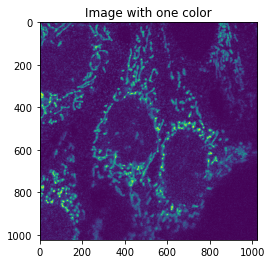

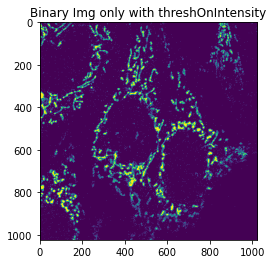

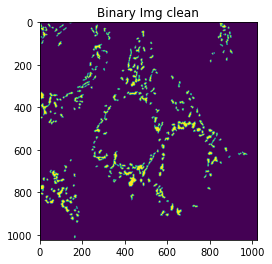

C:\Users\user\anaconda3\lib\site-packages\skimage\util\dtype.py:454: UserWarning: Downcasting int64 to uint16 without scaling because max value 244 fits in uint16
  return convert(image, np.uint16, force_copy)
<ipython-input-6-720188a3eef5>:17: UserWarning: C:/Users/user/Desktop/compression/TP_Biomedical_2020/TP_Biomedical_2020/Data/Mask/Train/normal18.tif is a low contrast image
  imsave(Path + "Mask/Train/" + basename, img_as_uint(labels))


T


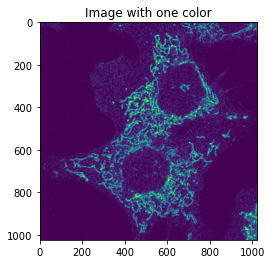

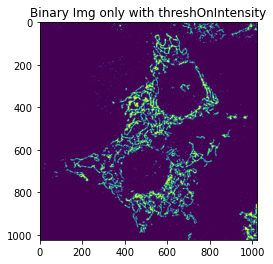

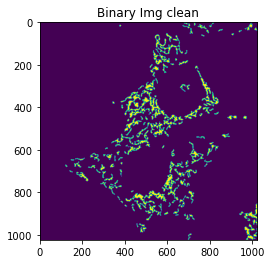

<ipython-input-6-720188a3eef5>:17: UserWarning: C:/Users/user/Desktop/compression/TP_Biomedical_2020/TP_Biomedical_2020/Data/Mask/Train/normal2 zoom1.5.tif is a low contrast image
  imsave(Path + "Mask/Train/" + basename, img_as_uint(labels))


T


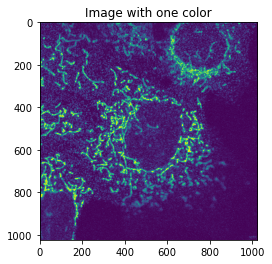

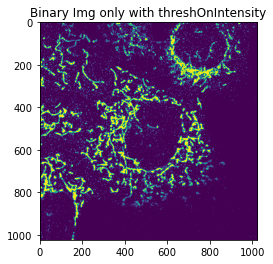

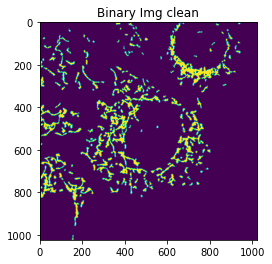

C:\Users\user\anaconda3\lib\site-packages\skimage\util\dtype.py:454: UserWarning: Downcasting int64 to uint16 without scaling because max value 216 fits in uint16
  return convert(image, np.uint16, force_copy)
<ipython-input-6-720188a3eef5>:17: UserWarning: C:/Users/user/Desktop/compression/TP_Biomedical_2020/TP_Biomedical_2020/Data/Mask/Train/normal20.tif is a low contrast image
  imsave(Path + "Mask/Train/" + basename, img_as_uint(labels))


T


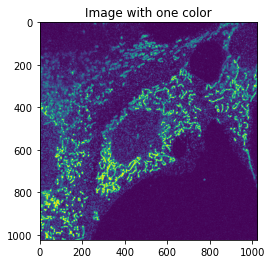

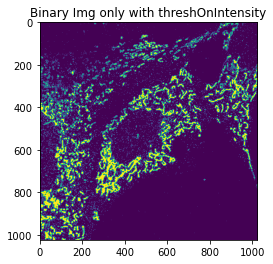

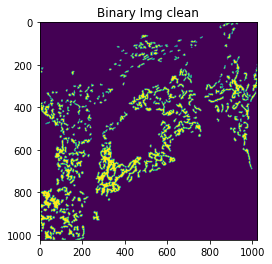

C:\Users\user\anaconda3\lib\site-packages\skimage\util\dtype.py:454: UserWarning: Downcasting int64 to uint16 without scaling because max value 311 fits in uint16
  return convert(image, np.uint16, force_copy)
<ipython-input-6-720188a3eef5>:17: UserWarning: C:/Users/user/Desktop/compression/TP_Biomedical_2020/TP_Biomedical_2020/Data/Mask/Train/normal21.tif is a low contrast image
  imsave(Path + "Mask/Train/" + basename, img_as_uint(labels))


T


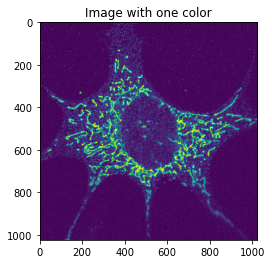

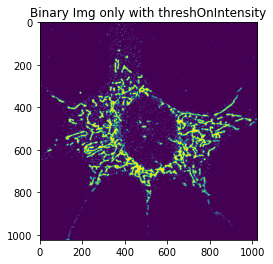

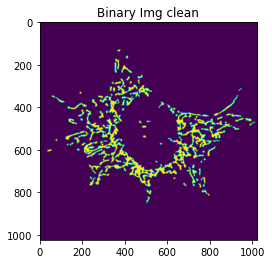

C:\Users\user\anaconda3\lib\site-packages\skimage\util\dtype.py:454: UserWarning: Downcasting int64 to uint16 without scaling because max value 111 fits in uint16
  return convert(image, np.uint16, force_copy)
<ipython-input-6-720188a3eef5>:17: UserWarning: C:/Users/user/Desktop/compression/TP_Biomedical_2020/TP_Biomedical_2020/Data/Mask/Train/normal23.tif is a low contrast image
  imsave(Path + "Mask/Train/" + basename, img_as_uint(labels))


T


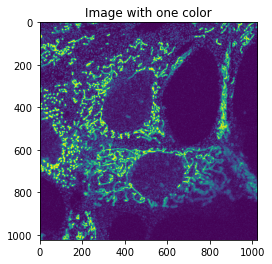

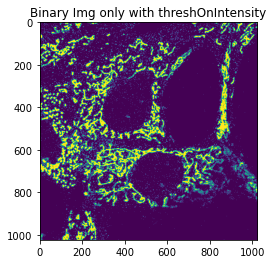

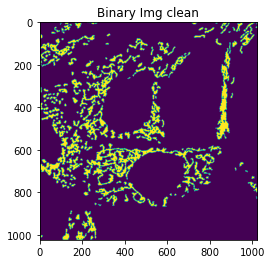

C:\Users\user\anaconda3\lib\site-packages\skimage\util\dtype.py:454: UserWarning: Downcasting int64 to uint16 without scaling because max value 218 fits in uint16
  return convert(image, np.uint16, force_copy)
<ipython-input-6-720188a3eef5>:17: UserWarning: C:/Users/user/Desktop/compression/TP_Biomedical_2020/TP_Biomedical_2020/Data/Mask/Train/normal24.tif is a low contrast image
  imsave(Path + "Mask/Train/" + basename, img_as_uint(labels))


T


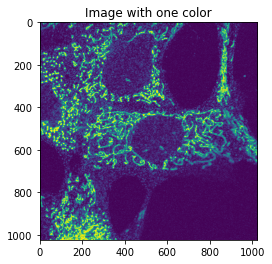

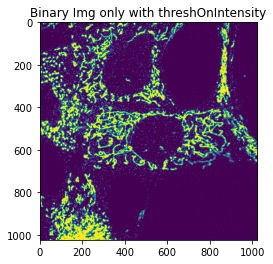

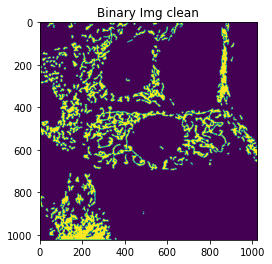

C:\Users\user\anaconda3\lib\site-packages\skimage\util\dtype.py:454: UserWarning: Downcasting int64 to uint16 without scaling because max value 213 fits in uint16
  return convert(image, np.uint16, force_copy)
<ipython-input-6-720188a3eef5>:17: UserWarning: C:/Users/user/Desktop/compression/TP_Biomedical_2020/TP_Biomedical_2020/Data/Mask/Train/normal25.tif is a low contrast image
  imsave(Path + "Mask/Train/" + basename, img_as_uint(labels))


T


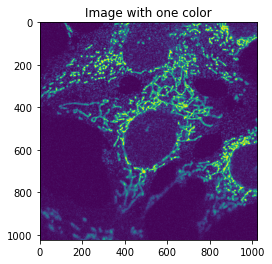

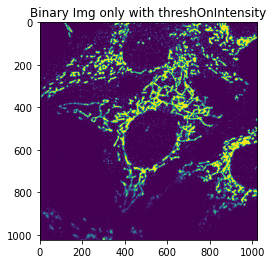

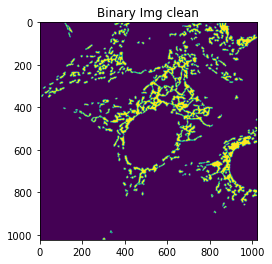

C:\Users\user\anaconda3\lib\site-packages\skimage\util\dtype.py:454: UserWarning: Downcasting int64 to uint16 without scaling because max value 220 fits in uint16
  return convert(image, np.uint16, force_copy)
<ipython-input-6-720188a3eef5>:17: UserWarning: C:/Users/user/Desktop/compression/TP_Biomedical_2020/TP_Biomedical_2020/Data/Mask/Train/normal26.tif is a low contrast image
  imsave(Path + "Mask/Train/" + basename, img_as_uint(labels))


T


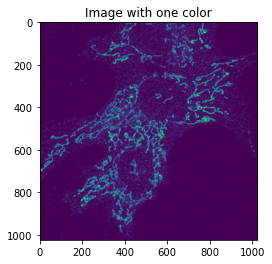

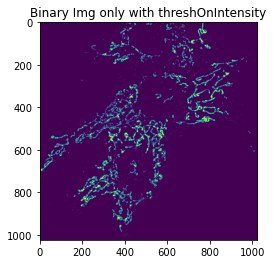

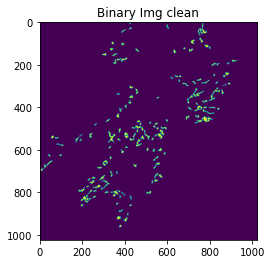

C:\Users\user\anaconda3\lib\site-packages\skimage\util\dtype.py:454: UserWarning: Downcasting int64 to uint16 without scaling because max value 164 fits in uint16
  return convert(image, np.uint16, force_copy)
<ipython-input-6-720188a3eef5>:17: UserWarning: C:/Users/user/Desktop/compression/TP_Biomedical_2020/TP_Biomedical_2020/Data/Mask/Train/normal3 zoom1.5.tif is a low contrast image
  imsave(Path + "Mask/Train/" + basename, img_as_uint(labels))


In [6]:
#Feature Lists
AreasListToTrain = []
CircularityListToTrain = []
Length_weightedListToTrain = []

#Reading images and parameters extraction
for image in All_images_TrainingSet:
    basename = os.path.basename(image)
    img = io.imread(image)
    print("T")
    img, BinaryImg_clean = Objectdetection(img)

    labels = label(BinaryImg_clean)
    
    if not os.path.exists(Path + "Mask/Train/"):
        os.mkdir(Path + "Mask/Train/")
    imsave(Path + "Mask/Train/" + basename, img_as_uint(labels))

    areas, centroids, perimeters, orientations, coord, Circularity, Length_weighted = FeaturesOfObjects(labels, img)

    AreasListToTrain += areas
    CircularityListToTrain += Circularity
    Length_weightedListToTrain += Length_weighted

## Simple transformations 

The goal of normalization is to change the values of numeric columns in the dataset to a common scale, without distorting differences in the ranges of values. Every dataset does not require normalization. It is required only when features have different ranges.

In [7]:
#Feature normalization
MinArea = np.min(AreasListToTrain)
MaxArea = np.max(AreasListToTrain)
AreasListToTrain = (AreasListToTrain-MinArea)/(MaxArea - MinArea)

MinLength = np.min(Length_weightedListToTrain)
MaxLength = np.max(Length_weightedListToTrain)
Length_weightedListToTrain = (Length_weightedListToTrain-MinLength)/(MaxLength - MinLength)


## k-means clustering

k-means clustering is a method of vector quantization, originally from signal processing, that is popular for cluster analysis in data mining. k-means clustering aims to partition n observations into k clusters in which each observation belongs to the cluster with the nearest mean, serving as a prototype of the cluster.

In this part:
- How many cluster you need? Precise this number by completing the variable "nb_clusters"

In [8]:
#Training instances to cluster

nb_clusters = 3

Features = np.hstack((np.array(AreasListToTrain), np.array(Length_weightedListToTrain), np.array(CircularityListToTrain))).ravel()
X = Features.reshape(3, len(AreasListToTrain)).T 

from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=nb_clusters, random_state=2).fit(X)

['C:/Users/user/Desktop/compression/TP_Biomedical_2020/TP_Biomedical_2020/Data/Test\\FilTest1.tif', 'C:/Users/user/Desktop/compression/TP_Biomedical_2020/TP_Biomedical_2020/Data/Test\\FragTest1.tif', 'C:/Users/user/Desktop/compression/TP_Biomedical_2020/TP_Biomedical_2020/Data/Test\\normalTest1.tif']
C:/Users/user/Desktop/compression/TP_Biomedical_2020/TP_Biomedical_2020/Data/Test\FilTest1.tif


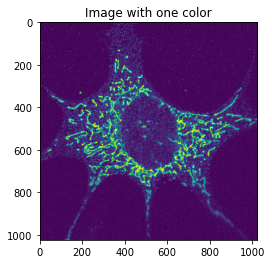

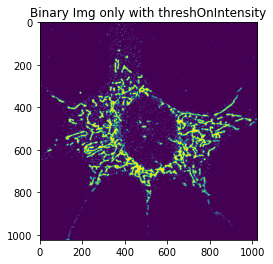

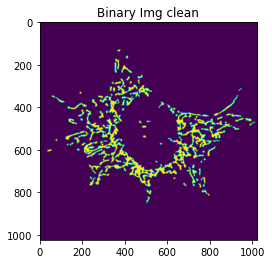

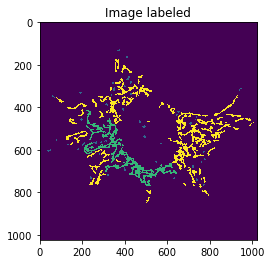

C:/Users/user/Desktop/compression/TP_Biomedical_2020/TP_Biomedical_2020/Data/Test\FragTest1.tif


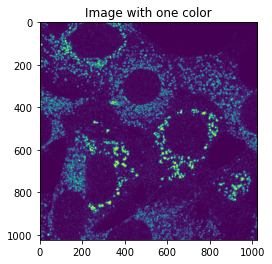

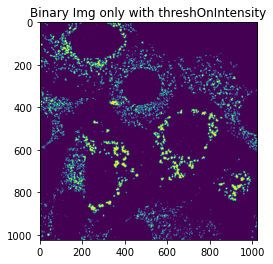

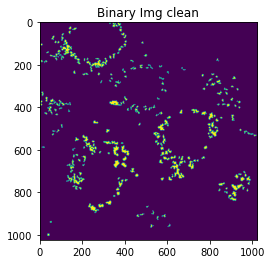

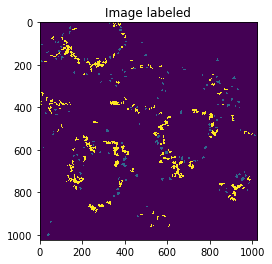

C:/Users/user/Desktop/compression/TP_Biomedical_2020/TP_Biomedical_2020/Data/Test\normalTest1.tif


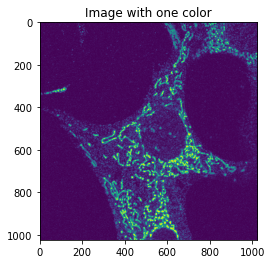

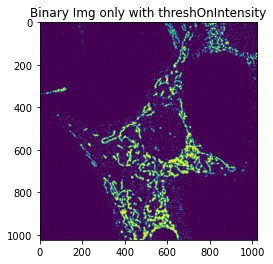

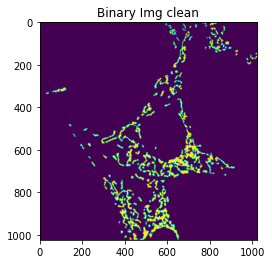

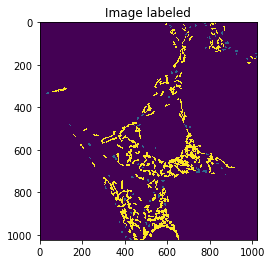

In [9]:
#Image Test detection, feature extraction and cluster prediction
print (All_images_TestSet)
for image in All_images_TestSet:
    basename = os.path.basename(image)
    print(image)
    img = io.imread(image)
    
    img, BinaryImg_clean = Objectdetection(img)

    from skimage.measure import regionprops, label
    labels = label(BinaryImg_clean)

    areas, centroids, perimeters, orientations, coord, Circularity, Length_weighted = FeaturesOfObjects(labels, img)

    areas = (areas - MinArea) / (MaxArea - MinArea)
    Length_weighted = (Length_weighted - MinLength) / (MaxLength - MinLength)
    Features = np.hstack((areas, Length_weighted, Circularity)).ravel()

    Xtest = Features.reshape(3, len(areas)).T

    Predictions = kmeans.predict(Xtest)

    ImageObjectsLabelizedByClass = 1*(BinaryImg_clean.copy())
    for l in np.unique(labels)[1:]:
        ImageObjectsLabelizedByClass[labels == l] = Predictions[l-1]+1
    fig = plt.figure()
    # show original image
    im = plt.imshow(ImageObjectsLabelizedByClass, interpolation='nearest')
    plt.title("Image labeled")
    plt.show()
    fig.colorbar(im)

  



In this part:

- For each images to be tested, show the following images:
    - After detection and cleaning.
    - After classification: image labeled according to the belonging of the objects to the different clusters.
- Describe the characteristics of classes according to the features used.
- Which step can be modified to improve the classification?
- What features can be added to improve classification?

Description des caractéristiques des classes en fonction des caractéristiques utilisées:

A partir des différentes caractéristiques nous pouvons déduire que pour les classes: 
    - Agregates sont definis par des regions circulaires d ou la caractéristique "circularity"
    - les filaments et hyper filamenteux sont définis par leurs tailles et formes allongés d ou "length_weighted" et "areas".
    
Etapes qui peuvent être modifées pour ameliorer la classification:
L etape : FeatureObjects. Nous pouvons ameliorer le calcul des caracteristiques de l image et extraire d autres caracteristiques.

Ce qu on peut ajouter pour améliorer la classification:
Nous pouvons rajouter "perimeters" of regionsprops. En effet, on aurait des perimètres différents selon le type de cellules. 
On peut rajouter aussi "centroids".